<a href="https://colab.research.google.com/github/skhabiri/DS-Unit-2-Kaggle-Challenge/blob/master/module1-decision-trees/skhabiri_LS_DS_221_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*Unit 2, Sprint 2, Module 1*

---

# Decision Trees

## Assignment
- [ ] [Sign up for a Kaggle account](https://www.kaggle.com/), if you don’t already have one. Go to our Kaggle InClass competition website. You will be given the URL in Slack. Go to the Rules page. Accept the rules of the competition. Notice that the Rules page also has instructions for the Submission process. The Data page has feature definitions.
- [ ] Do train/validate/test split with the Tanzania Waterpumps data.
- [ ] Begin with baselines for classification.
- [ ] Select features. Use a scikit-learn pipeline to encode categoricals, impute missing values, and fit a decision tree classifier.
- [ ] Get your validation accuracy score.
- [ ] Get and plot your feature importances.
- [ ] Submit your predictions to our Kaggle competition. (Go to our Kaggle InClass competition webpage. Use the blue **Submit Predictions** button to upload your CSV file. Or you can use the Kaggle API to submit your predictions.)
- [ ] Commit your notebook to your fork of the GitHub repo.


## Stretch Goals

### Reading

- A Visual Introduction to Machine Learning
  - [Part 1: A Decision Tree](http://www.r2d3.us/visual-intro-to-machine-learning-part-1/)
  - [Part 2: Bias and Variance](http://www.r2d3.us/visual-intro-to-machine-learning-part-2/)
- [Decision Trees: Advantages & Disadvantages](https://christophm.github.io/interpretable-ml-book/tree.html#advantages-2)
- [How a Russian mathematician constructed a decision tree — by hand — to solve a medical problem](http://fastml.com/how-a-russian-mathematician-constructed-a-decision-tree-by-hand-to-solve-a-medical-problem/)
- [How decision trees work](https://brohrer.github.io/how_decision_trees_work.html)
- [Let’s Write a Decision Tree Classifier from Scratch](https://www.youtube.com/watch?v=LDRbO9a6XPU) — _Don’t worry about understanding the code, just get introduced to the concepts. This 10 minute video has excellent diagrams and explanations._
- [Random Forests for Complete Beginners: The definitive guide to Random Forests and Decision Trees](https://victorzhou.com/blog/intro-to-random-forests/)


### Doing
- [ ] Add your own stretch goal(s) !
- [ ] Define a function to wrangle train, validate, and test sets in the same way. Clean outliers and engineer features. (For example, [what columns have zeros and shouldn't?](https://github.com/Quartz/bad-data-guide#zeros-replace-missing-values) What columns are duplicates, or nearly duplicates? Can you extract the year from date_recorded? Can you engineer new features, such as the number of years from waterpump construction to waterpump inspection?)
- [ ] Try other [scikit-learn imputers](https://scikit-learn.org/stable/modules/impute.html).
- [ ] Make exploratory visualizations and share on Slack.


#### Exploratory visualizations

Visualize the relationships between feature(s) and target. I recommend you do this with your training set, after splitting your data. 

For this problem, you may want to create a new column to represent the target as a number, 0 or 1. For example:

```python
train['functional'] = (train['status_group']=='functional').astype(int)
```



You can try [Seaborn "Categorical estimate" plots](https://seaborn.pydata.org/tutorial/categorical.html) for features with reasonably few unique values. (With too many unique values, the plot is unreadable.)

- Categorical features. (If there are too many unique values, you can replace less frequent values with "OTHER.")
- Numeric features. (If there are too many unique values, you can [bin with pandas cut / qcut functions](https://pandas.pydata.org/pandas-docs/stable/getting_started/basics.html?highlight=qcut#discretization-and-quantiling).)

You can try [Seaborn linear model plots](https://seaborn.pydata.org/tutorial/regression.html) with numeric features. For this classification problem, you may want to use the parameter `logistic=True`, but it can be slow.

You do _not_ need to use Seaborn, but it's nice because it includes confidence intervals to visualize uncertainty.

#### High-cardinality categoricals

This code from a previous assignment demonstrates how to replace less frequent values with 'OTHER'

```python
# Reduce cardinality for NEIGHBORHOOD feature ...

# Get a list of the top 10 neighborhoods
top10 = train['NEIGHBORHOOD'].value_counts()[:10].index

# At locations where the neighborhood is NOT in the top 10,
# replace the neighborhood with 'OTHER'
train.loc[~train['NEIGHBORHOOD'].isin(top10), 'NEIGHBORHOOD'] = 'OTHER'
test.loc[~test['NEIGHBORHOOD'].isin(top10), 'NEIGHBORHOOD'] = 'OTHER'
```


In [25]:
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://github.com/skhabiri/PredictiveModeling-TreeBasedModels-u2s2/tree/master/data/'
    !pip install category_encoders==2.*
    !pip install pandas-profiling==2.*

# If you're working locally:
else:
    DATA_PATH = '../data/'

In [26]:
import pandas as pd
from sklearn.model_selection import train_test_split

train = pd.merge(pd.read_csv(DATA_PATH+'waterpumps/train_features.csv'), 
                 pd.read_csv(DATA_PATH+'waterpumps/train_labels.csv'))
test = pd.read_csv(DATA_PATH+'waterpumps/test_features.csv')
sample_submission = pd.read_csv(DATA_PATH+'waterpumps/sample_submission.csv')

train.shape, test.shape

((59400, 41), (14358, 40))

In [3]:
from pandas_profiling import ProfileReport
profile = ProfileReport(train, minimal=True).to_notebook_iframe()

profile

In [37]:
import numpy as np
def wrangle(data, skew0=0.9, skew01=5):
    """
    skew0: threshold amount for the relative most frequent value count in a column
    skew01: threshold amount for the 1st to 2nd most frequent value count in a column
    """

    df = data.copy()
    # About 3% of the time, latitude has small values near zero,
    # outside Tanzania, so we'll treat these values like zero.
    df['latitude'] = df['latitude'].replace(-2e-08, 0)

    # When columns have zeros and shouldn't, they are like null values.
    # So we will replace the zeros with nulls, and impute missing values later.
    cols_with_zeros = ['longitude', 'latitude']
    for col in cols_with_zeros:
        df[col] = df[col].replace(0, np.nan)

    # quantity & quantity_group are duplicates, so drop one
    if 'quantity_group' in df:
        df = df.drop(columns='quantity_group')

    #split columns into numeric and not numeric
    numeric_cols = df.select_dtypes(include='number').columns
    cat_cols = df.columns[~df.columns.isin(numeric_cols)]
    assert len(df.columns) == len(numeric_cols)+len(cat_cols)

    drop_cols = []
    #numeric columns skewness, how frequent is one value repeated
    for col in numeric_cols:
        nuniq = df[col].nunique()
        print(f"df[{col}].nunique():{df[col].nunique()}")
        skew_item0 = df[col].value_counts(sort=True, ascending=False, dropna=False).index[0]
        skew_item1 = df[col].value_counts(sort=True, ascending=False, dropna=False).index[1]

        # The relative frequency of most repeated value compared to the length of the series
        skew_0 = df[col].value_counts(sort=True, ascending=False, dropna=False)[skew_item0]/len(df[col])
        # most repeated value inn respect to second most frequent value in the series
        skew_0_1 = df[col].value_counts(sort=True, ascending=False, dropna=False)[skew_item0]/df[col].value_counts(sort=True, ascending=False, dropna=False)[skew_item1]

        if  ((skew_0 >= skew0) or (skew_0_1 >= skew01)):
          print(f'number of unique values in {col}: {nuniq}\n "{skew_item0}" skews "{col}" by {skew_0:.2%}')
          print(f' First most value "{skew_item0}" is repeated {skew_0_1:.1f} times more than the second most value "{skew_item1}"\n')

          if ~np.isnan(skew_item0) and skew_item0 not in [0]:
            # df = df.drop(labels=col, axis =1)
            drop_cols.append(col)
            print(f'{col} is being dropped')

    print(data.shape, df.shape)

    # return the wrangled dataframe
    return df, drop_cols

In [38]:
# Split train into train & val
train, val = train_test_split(train, train_size=0.80, test_size=0.20, 
                              stratify=train['status_group'], random_state=42)

train.shape, val.shape, test.shape

((30412, 40), (7604, 40), (14358, 39))

In [39]:
train.dtypes.unique()

array([dtype('int64'), dtype('float64'), dtype('O')], dtype=object)

In [40]:
for i in train:
    print(i, type(i))

id <class 'str'>
amount_tsh <class 'str'>
date_recorded <class 'str'>
funder <class 'str'>
gps_height <class 'str'>
installer <class 'str'>
longitude <class 'str'>
latitude <class 'str'>
wpt_name <class 'str'>
num_private <class 'str'>
basin <class 'str'>
subvillage <class 'str'>
region <class 'str'>
region_code <class 'str'>
district_code <class 'str'>
lga <class 'str'>
ward <class 'str'>
population <class 'str'>
public_meeting <class 'str'>
recorded_by <class 'str'>
scheme_management <class 'str'>
scheme_name <class 'str'>
permit <class 'str'>
construction_year <class 'str'>
extraction_type <class 'str'>
extraction_type_group <class 'str'>
extraction_type_class <class 'str'>
management <class 'str'>
management_group <class 'str'>
payment <class 'str'>
payment_type <class 'str'>
water_quality <class 'str'>
quality_group <class 'str'>
quantity <class 'str'>
source <class 'str'>
source_type <class 'str'>
source_class <class 'str'>
waterpoint_type <class 'str'>
waterpoint_type_group <cla

In [41]:
# DRY programming DON'T REPEAT YOURSELF
train, droplist = wrangle(train,0.9,5)
"""
We do not drop the columns inside wrangle function as the statistical skewness might not be 
the same for train, validation, and test set. We use the train drop list to drop the same 
columns from validation and test sets.
"""
val, dummy = wrangle(val.drop(droplist),0.9,5)
test, dummy = wrangle(test.drop(droplist),0.9,5)
train.shape, val.shape, test.shape


df[id].nunique():30412
df[amount_tsh].nunique():84
number of unique values in amount_tsh: 84
 "0.0" skews "amount_tsh" by 69.86%
 First most value "0.0" is repeated 13.4 times more than the second most value "500.0"

df[gps_height].nunique():2323
number of unique values in gps_height: 2323
 "0" skews "gps_height" by 34.26%
 First most value "0" is repeated 347.3 times more than the second most value "12"

df[longitude].nunique():29466
number of unique values in longitude: 29466
 "nan" skews "longitude" by 3.03%
 First most value "nan" is repeated 460.5 times more than the second most value "39.10375198"

df[latitude].nunique():29466
number of unique values in latitude: 29466
 "nan" skews "latitude" by 3.03%
 First most value "nan" is repeated 460.5 times more than the second most value "-2.48708461"

df[num_private].nunique():50
number of unique values in num_private: 50
 "0" skews "num_private" by 98.81%
 First most value "0" is repeated 715.5 times more than the second most value "6"

((30412, 40), (7604, 40), (14358, 39))

In [42]:
sample_submission.head()

,id,status_group
0,50785,functional
1,51630,functional
2,17168,functional
3,45559,functional
4,49871,functional


In [43]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30412 entries, 23756 to 21009
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     30412 non-null  int64  
 1   amount_tsh             30412 non-null  float64
 2   date_recorded          30412 non-null  object 
 3   funder                 28581 non-null  object 
 4   gps_height             30412 non-null  int64  
 5   installer              28571 non-null  object 
 6   longitude              29491 non-null  float64
 7   latitude               29491 non-null  float64
 8   wpt_name               30412 non-null  object 
 9   num_private            30412 non-null  int64  
 10  basin                  30412 non-null  object 
 11  subvillage             30227 non-null  object 
 12  region                 30412 non-null  object 
 13  region_code            30412 non-null  int64  
 14  district_code          30412 non-null  int64  
 15

This is a multi-class classification problem. The majority class occurs with 54% frequency.

functional                 0.543108
non functional             0.384223
functional needs repair    0.072669
Name: status_group, dtype: float64

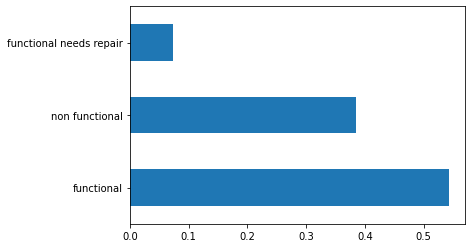

In [44]:
train['status_group'].value_counts(normalize=True).plot(kind='barh')
train['status_group'].value_counts(normalize=True)

In [45]:
(train['longitude']==0).sum()

0

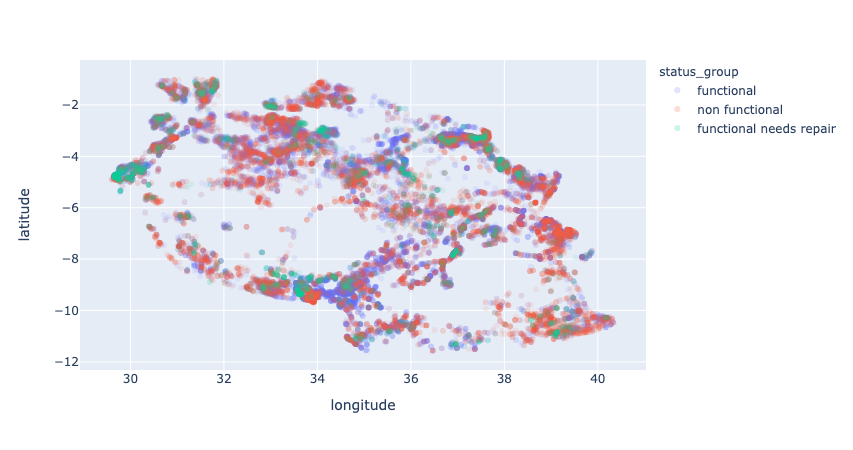

In [46]:
import plotly.express as px
px.scatter(train, x='longitude', y='latitude', color='status_group', opacity=0.1)

In [47]:
train[['longitude', 'latitude']].describe()

,longitude,latitude
count,29491.000000,29491.000000
mean,35.147330,-5.869702
std,2.609467,2.799444
min,29.607122,-11.568577
25%,33.280542,-8.599070
50%,35.011527,-5.138480
75%,37.226461,-3.372346
max,40.344301,-0.998464


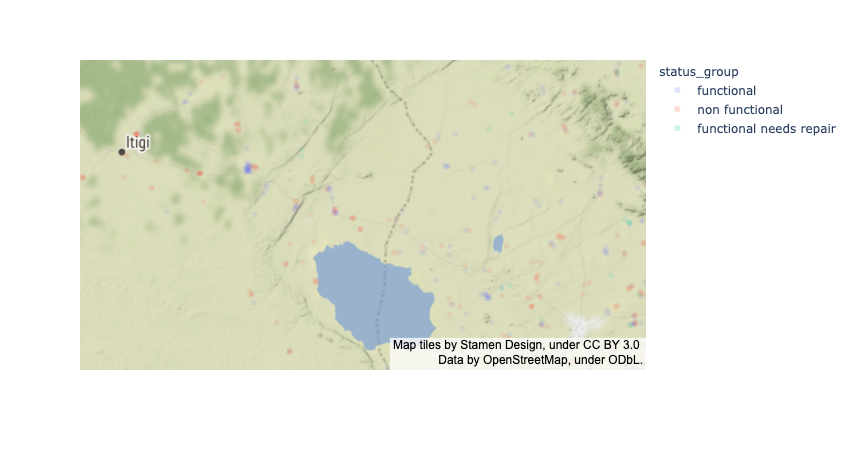

In [51]:
# https://plot.ly/python/mapbox-layers/#base-maps-in-layoutmapboxstyle
fig = px.scatter_mapbox(train, lat='latitude', lon='longitude', color='status_group', opacity=0.1)
fig.update_layout(mapbox_style='stamen-terrain')
fig.show()

creat a feature list of numeric columns as categorical ones with low cardinality

In [52]:
# The status_group column is the target
target = 'status_group'

# Get a dataframe with all train columns except the target & id
train_features = train.drop(columns=[target, 'id'])

# Get a list of the numeric features
numeric_features = train_features.select_dtypes(include='number').columns.tolist()

# Get a series with the cardinality of the nonnumeric features
cardinality = train_features.select_dtypes(exclude='number').nunique()

# Get a list of all categorical features with cardinality <= 50
categorical_features = cardinality[cardinality <= 50].index.tolist()

# Combine the lists 
features = numeric_features + categorical_features
print(features)

['amount_tsh', 'gps_height', 'longitude', 'latitude', 'num_private', 'region_code', 'district_code', 'population', 'construction_year', 'basin', 'region', 'public_meeting', 'recorded_by', 'scheme_management', 'permit', 'extraction_type', 'extraction_type_group', 'extraction_type_class', 'management', 'management_group', 'payment', 'payment_type', 'water_quality', 'quality_group', 'quantity', 'source', 'source_type', 'source_class', 'waterpoint_type', 'waterpoint_type_group']


In [54]:
cardinality.sort_values()

recorded_by                  1
public_meeting               2
permit                       2
source_class                 3
quantity                     5
management_group             5
quality_group                6
waterpoint_type_group        6
payment_type                 7
payment                      7
source_type                  7
waterpoint_type              7
extraction_type_class        7
water_quality                8
basin                        9
source                      10
management                  12
scheme_management           12
extraction_type_group       13
extraction_type             18
region                      21
lga                        124
date_recorded              334
funder                    1407
installer                 1555
ward                      2057
scheme_name               2257
subvillage               13467
wpt_name                 20659
dtype: int64

In [55]:
# Arrange data into X features matrix and y target vector 
X_train = train[features]
y_train = train[target]
X_val = val[features]
y_val = val[target]
X_test = test[features]

In [56]:
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler


Pipeline with Logistic regression

In [57]:
pipe_model = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True, cols=categorical_features),
    SimpleImputer(),
    StandardScaler(),
    LogisticRegression(n_jobs=-1)
)

# Fit
pipe_model.fit(X_train, y_train)

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



Pipeline(steps=[('onehotencoder',
                 OneHotEncoder(cols=['basin', 'region', 'public_meeting',
                                     'recorded_by', 'scheme_management',
                                     'permit', 'extraction_type',
                                     'extraction_type_group',
                                     'extraction_type_class', 'management',
                                     'management_group', 'payment',
                                     'payment_type', 'water_quality',
                                     'quality_group', 'quantity', 'source',
                                     'source_type', 'source_class',
                                     'waterpoint_type',
                                     'waterpoint_type_group'],
                               use_cat_names=True)),
                ('simpleimputer', SimpleImputer()),
                ('standardscaler', StandardScaler()),
                ('logisticregression', LogisticRegressi

In [58]:
# Metrics
print('Training Accuracy', pipe_model.score(X_train, y_train))
print('Validation Accuracy', pipe_model.score(X_val, y_val))

Training Accuracy 0.7325397869262134
Validation Accuracy 0.7310625986322988


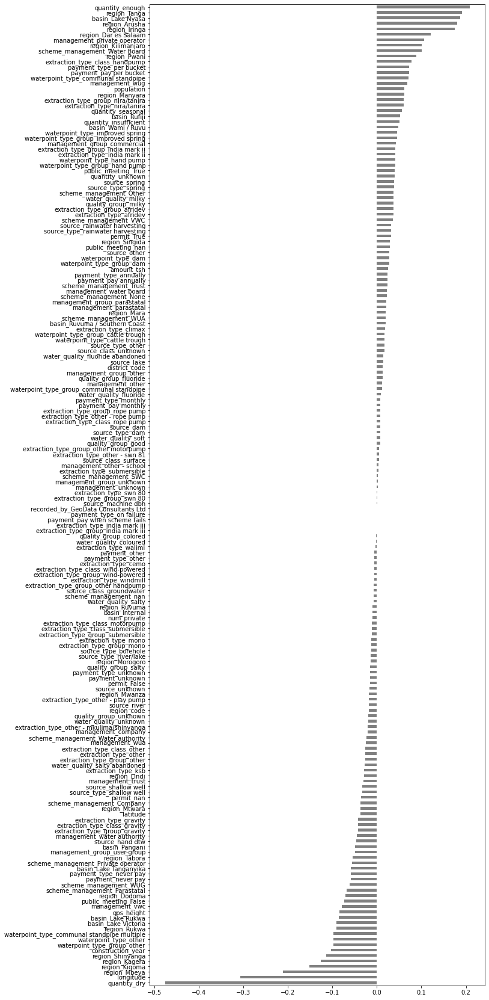

In [59]:
%matplotlib inline
import matplotlib.pyplot as plt

# model and encoder are pre trained (fit).
model = pipe_model.named_steps['logisticregression']
encoder = pipe_model.named_steps['onehotencoder']
encoded_columns = encoder.transform(X_val).columns
#.coef_ returns a nested list
coefficients = pd.Series(model.coef_[0], encoded_columns)
plt.figure(figsize=(10,30))
coefficients.sort_values().plot.barh(color='grey');

In [60]:
encoded_columns.shape

(180,)

In [61]:
coefficients[:10]

amount_tsh           0.024676
gps_height          -0.084649
longitude           -0.306845
latitude            -0.037610
num_private         -0.010663
region_code         -0.018596
district_code        0.013453
population           0.062066
construction_year   -0.102749
basin_Rufiji         0.052705
dtype: float64

In [62]:
"gps_height" in encoded_columns

True

### Decision Tree

In [63]:
from sklearn.tree import DecisionTreeClassifier

dt_model = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    DecisionTreeClassifier(random_state=42)
)

dt_model.fit(X_train, y_train);

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



In [64]:
# Metrics
print('Training Accuracy', dt_model.score(X_train, y_train))
print('Validation Accuracy', dt_model.score(X_val, y_val))

Training Accuracy 0.9954951992634486
Validation Accuracy 0.740136770120989


Decision tree overfit the training data

### Plot the tree

We need class_names and feature_names to create graphviz dot_data

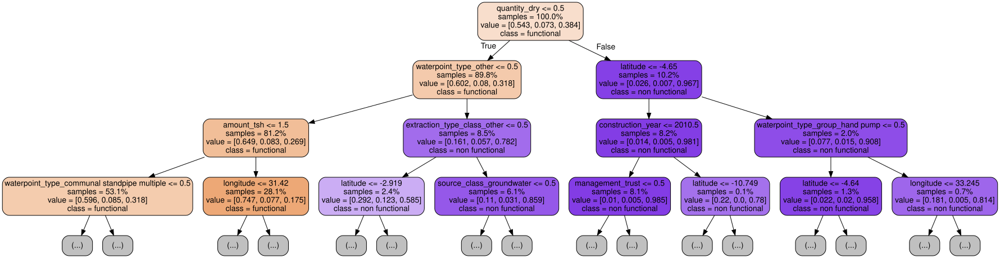

In [65]:
# Plot tree
# https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html
import graphviz
from sklearn.tree import export_graphviz

model = dt_model.named_steps['decisiontreeclassifier']
encoder = dt_model.named_steps['onehotencoder']
encoded_columns = encoder.transform(X_val).columns

dot_data = export_graphviz(model, 
                           out_file=None, 
                           max_depth=3, 
                           feature_names=encoded_columns,
                           class_names=model.classes_, 
                           impurity=False, 
                           filled=True, 
                           proportion=True, 
                           rounded=True)   
display(graphviz.Source(dot_data))

In graphviz, value refers to pval of three classes. samples show what % of train data are used for that branch.

In [66]:
model.classes_

array(['functional', 'functional needs repair', 'non functional'],
      dtype=object)

Let's limit the max_depth to avoid overfitting

In [67]:
dt_model = make_pipeline(
    ce.OneHotEncoder(use_cat_names=True),
    SimpleImputer(),
    DecisionTreeClassifier(random_state=42, max_depth=5)
)

dt_model.fit(X_train, y_train);

/Users/shahnam/.pyenv/versions/3.7.8/lib/python3.7/site-packages/category_encoders/utils.py:21: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



In [68]:
# Metrics
print('Training Accuracy', dt_model.score(X_train, y_train))
print('Validation Accuracy', dt_model.score(X_val, y_val))

Training Accuracy 0.7157700907536498
Validation Accuracy 0.713440294581799


In [70]:
pred1 = dt_model.predict(X_test)
pred1
# pd.DataFrame(pred1, columns = pred1.columns)

array(['functional', 'functional', 'functional', ..., 'functional',
       'functional', 'non functional'], dtype=object)

feature_importances_ is a positive number

In [73]:
# we have 180 encoded features
print(len(model.feature_importances_))
model.feature_importances_[:20]

180


array([0.02297064, 0.06875884, 0.16663087, 0.16330144, 0.00087744,
       0.00956075, 0.01785423, 0.04887878, 0.04598423, 0.0008645 ,
       0.00070987, 0.00482494, 0.00162461, 0.0025128 , 0.00066543,
       0.00061837, 0.0002052 , 0.00192568, 0.00017189, 0.00017179])

<AxesSubplot:>

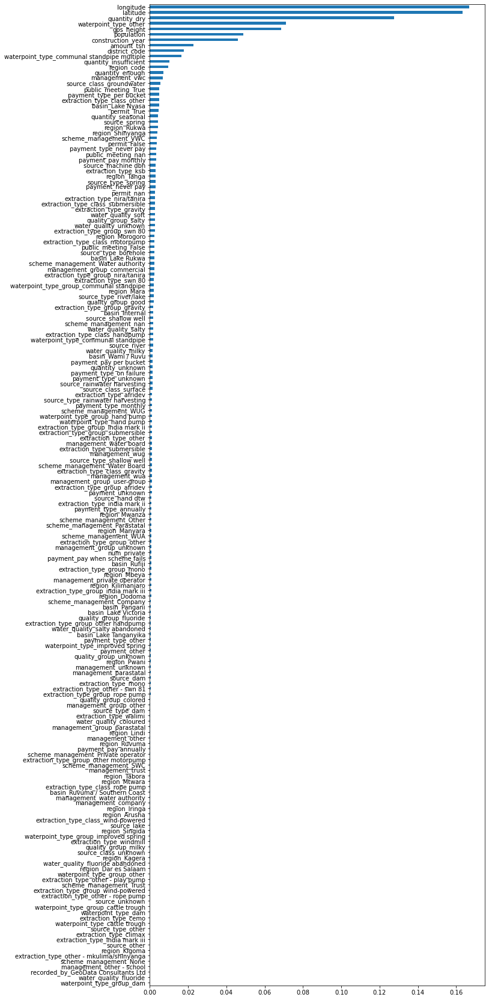

In [74]:
importances = pd.Series(model.feature_importances_, encoded_columns)
plt.figure(figsize=(10,30))
importances.sort_values().plot.barh()

In [75]:
submission_1 = sample_submission.copy()
submission_1["status_group"] = pred1
submission_1.nunique()

id              14358
status_group        3
dtype: int64

In [76]:
submission_1.to_csv("submission_1.csv", index=False)